<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [1]:
# import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [2]:
import json

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
from tqdm import tqdm
import h5py

In [5]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm

You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [6]:
f = h5py.File('img_codes.hdf5', 'r')
img_codes = f['data']

In [7]:
captions = json.load(open('captions_tokenized.json'))

In [8]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [9]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [10]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
# <YOUR CODE HERE>
for img_i in captions:
    for sentence in img_i:
        word_counts.update(sentence)

In [11]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [12]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [13]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [14]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [15]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        # <YOUR CODE HERE>
        
        result = torch.bmm(queries,keys.permute(0,2, 1))/np.sqrt(keys.size()[2])
        return result

In [16]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


Test for ScaledDotProductScore

In [17]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


In [18]:
# F.softmax()

#### Attention layer

In [19]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        # <YOUR CODE HERE>
        weights = F.softmax(scores, dim=-1)
        result = torch.matmul(weights, values)
        self.attention_map = weights.detach()
        self.last_weights = weights
        # <YOUR CODE HERE>
        return result

Tests for Attention layer

In [20]:
attn = Attention(ScaledDotProductScore())

In [21]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [22]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.last_weights).sum() == 0
assert torch.isnan(a).sum() == 0

In [23]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.last_weights)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [24]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)
        
        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size) 
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())
        
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels,lstm_units)
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(emb_size+cnn_channels, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Linear(lstm_units+cnn_channels+emb_size, n_tokens)
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))
        
        image_features = image_features.transpose(1, 2)
        
        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)# <YOUR CODE>
        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        hn, cn = initial_hid, initial_cell

#         attention_map = torch.zeros(captions_ix.size()[0],captions_ix.size()[1], image_features.size()[1])#.to(self.device)
#         reccurent_out = torch.zeros(captions_ix.size()[0],captions_ix.size()[1], hn.size()[1]+\
#                                     image_features.size()[2]+captions_emb.shape[-1])#.to(self.device)
        # 2. In the recurrent loop over tokens:
        for i in range(captions_emb.shape[1]):
        #   2.1. transform image vectors to the keys for attention
            keys = self.cnn_to_attn_key(image_features)
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
            attn = self.attention(torch.unsqueeze(hn, 1),keys,image_features)
            
        #   2.4. store attention map
#             attention_map[:,i,:] = torch.squeeze(self.attention.attention_map)
            if i==0:
                attention_map = self.attention.attention_map
            else:
                attention_map = torch.cat([attention_map, self.attention.attention_map], dim=1)
        #   2.5. feed lstm with current token embedding concatenated with context vector
            hn, cn = self.lstm(torch.cat((captions_emb[:,i,:],torch.squeeze(attn, 1)),1), (hn,cn))
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
#             break
#             reccurent_out[:,i,:] = torch.cat((hn, torch.squeeze(attn, 1), captions_emb[:,i,:]), 1)
            if i==0:
                reccurent_out = torch.unsqueeze(torch.cat((hn, torch.squeeze(attn, 1), captions_emb[:,i,:]), 1), 1)
            else:
                reccurent_out = torch.cat([reccurent_out, torch.unsqueeze(torch.cat((hn, torch.squeeze(attn, 1), captions_emb[:,i,:]), 1), 1)], dim=1)
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
#         reccurent_out = # <YOUR_CODE>
#         attention_map = # <YOUR CODE>
        
        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp(reccurent_out)
        
        # return logits and attention maps from (2.4)
        return logits, attention_map

In [25]:
n_tokens

10403

In [26]:
network = CaptionNet(n_tokens)

In [27]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)
# print(dummy_img_vec.shape)
# print(dummy_capt_ix.shape)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [28]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    
    loss = F.cross_entropy(logits_for_next.permute((0,2,1)), captions_ix_next, ignore_index=pad_ix).unsqueeze(dim=0)# <YOUR CODE>

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [29]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [30]:
optimizer = torch.optim.Adam(network.parameters())

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [31]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [32]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [33]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [34]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [35]:
batch_size = 64  # adjust me
n_epochs = 128    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [36]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
        
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            # <YOUR CODE>
            optimizer.zero_grad()
            loss_t.backward()
            optimizer.step()
            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch
        
    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)
print("Finished!")

100%|██████████| 64/64 [00:05<00:00, 11.25it/s]



Epoch: 0, train loss: 7.043225757777691, val loss: 5.514803051948547


100%|██████████| 64/64 [00:05<00:00, 10.86it/s]



Epoch: 1, train loss: 5.045368447899818, val loss: 4.7105541825294495


100%|██████████| 64/64 [00:05<00:00, 11.45it/s]



Epoch: 2, train loss: 4.587257467210293, val loss: 4.513403832912445


100%|██████████| 64/64 [00:05<00:00, 12.10it/s]



Epoch: 3, train loss: 4.403362289071083, val loss: 4.313015520572662


100%|██████████| 64/64 [00:05<00:00, 10.91it/s]



Epoch: 4, train loss: 4.228067383170128, val loss: 4.266446888446808


100%|██████████| 64/64 [00:05<00:00, 11.13it/s]



Epoch: 5, train loss: 4.138029087334871, val loss: 3.9738508462905884


100%|██████████| 64/64 [00:05<00:00, 10.92it/s]



Epoch: 6, train loss: 4.040403001010418, val loss: 4.01870459318161


100%|██████████| 64/64 [00:05<00:00, 11.10it/s]



Epoch: 7, train loss: 4.016088590025902, val loss: 3.921779543161392


100%|██████████| 64/64 [00:05<00:00, 11.16it/s]



Epoch: 8, train loss: 3.9450348876416683, val loss: 3.9167613089084625


100%|██████████| 64/64 [00:05<00:00, 10.70it/s]



Epoch: 9, train loss: 3.868723452091217, val loss: 3.8576139211654663


100%|██████████| 64/64 [00:05<00:00, 11.58it/s]



Epoch: 10, train loss: 3.828245732933283, val loss: 3.7635955214500427


100%|██████████| 64/64 [00:06<00:00, 10.66it/s]



Epoch: 11, train loss: 3.8201820217072964, val loss: 3.8201854825019836


100%|██████████| 64/64 [00:05<00:00, 10.88it/s]



Epoch: 12, train loss: 3.7740824818611145, val loss: 3.6974347829818726


100%|██████████| 64/64 [00:05<00:00, 10.92it/s]



Epoch: 13, train loss: 3.746449302881956, val loss: 3.7831287682056427


100%|██████████| 64/64 [00:05<00:00, 11.08it/s]



Epoch: 14, train loss: 3.7180048003792763, val loss: 3.7080987691879272


100%|██████████| 64/64 [00:06<00:00, 10.62it/s]



Epoch: 15, train loss: 3.6899479515850544, val loss: 3.637941986322403


100%|██████████| 64/64 [00:06<00:00, 10.50it/s]



Epoch: 16, train loss: 3.6799743473529816, val loss: 3.623203992843628


100%|██████████| 64/64 [00:05<00:00, 10.89it/s]



Epoch: 17, train loss: 3.657790306955576, val loss: 3.5379018783569336


100%|██████████| 64/64 [00:05<00:00, 10.69it/s]



Epoch: 18, train loss: 3.6265977136790752, val loss: 3.683572292327881


100%|██████████| 64/64 [00:05<00:00, 11.12it/s]



Epoch: 19, train loss: 3.633608218282461, val loss: 3.5689485371112823


100%|██████████| 64/64 [00:05<00:00, 10.85it/s]



Epoch: 20, train loss: 3.599279537796974, val loss: 3.553236812353134


100%|██████████| 64/64 [00:05<00:00, 11.25it/s]



Epoch: 21, train loss: 3.5651401728391647, val loss: 3.6005874574184418


100%|██████████| 64/64 [00:05<00:00, 11.41it/s]



Epoch: 22, train loss: 3.5715742632746696, val loss: 3.511649876832962


100%|██████████| 64/64 [00:05<00:00, 11.15it/s]



Epoch: 23, train loss: 3.563371669501066, val loss: 3.5529463589191437


100%|██████████| 64/64 [00:05<00:00, 10.83it/s]



Epoch: 24, train loss: 3.547764353454113, val loss: 3.5107854306697845


100%|██████████| 64/64 [00:05<00:00, 10.70it/s]



Epoch: 25, train loss: 3.5289764404296875, val loss: 3.459784597158432


100%|██████████| 64/64 [00:05<00:00, 11.08it/s]



Epoch: 26, train loss: 3.486866895109415, val loss: 3.588364452123642


100%|██████████| 64/64 [00:06<00:00, 10.64it/s]



Epoch: 27, train loss: 3.486044242978096, val loss: 3.5218275785446167


100%|██████████| 64/64 [00:05<00:00, 11.02it/s]



Epoch: 28, train loss: 3.4247707091271877, val loss: 3.4003921449184418


100%|██████████| 64/64 [00:05<00:00, 10.94it/s]



Epoch: 29, train loss: 3.455344419926405, val loss: 3.5315889716148376


100%|██████████| 64/64 [00:05<00:00, 10.86it/s]



Epoch: 30, train loss: 3.442784208804369, val loss: 3.474765121936798


100%|██████████| 64/64 [00:05<00:00, 10.98it/s]



Epoch: 31, train loss: 3.424680083990097, val loss: 3.5174257159233093


100%|██████████| 64/64 [00:05<00:00, 11.80it/s]



Epoch: 32, train loss: 3.4072859175503254, val loss: 3.4616964757442474


100%|██████████| 64/64 [00:05<00:00, 11.66it/s]



Epoch: 33, train loss: 3.4193953834474087, val loss: 3.3885921239852905


100%|██████████| 64/64 [00:05<00:00, 10.69it/s]



Epoch: 34, train loss: 3.4225064627826214, val loss: 3.521135091781616


100%|██████████| 64/64 [00:06<00:00, 10.53it/s]



Epoch: 35, train loss: 3.3967874832451344, val loss: 3.350229173898697


100%|██████████| 64/64 [00:05<00:00, 10.81it/s]



Epoch: 36, train loss: 3.427657812833786, val loss: 3.5177612900733948


100%|██████████| 64/64 [00:05<00:00, 10.76it/s]



Epoch: 37, train loss: 3.425832360982895, val loss: 3.4371093809604645


100%|██████████| 64/64 [00:05<00:00, 10.87it/s]



Epoch: 38, train loss: 3.3800779059529305, val loss: 3.477927654981613


100%|██████████| 64/64 [00:05<00:00, 10.82it/s]



Epoch: 39, train loss: 3.376821093261242, val loss: 3.355427175760269


100%|██████████| 64/64 [00:06<00:00, 10.54it/s]



Epoch: 40, train loss: 3.3748518116772175, val loss: 3.2781164348125458


100%|██████████| 64/64 [00:06<00:00, 10.58it/s]



Epoch: 41, train loss: 3.3361880891025066, val loss: 3.38928285241127


100%|██████████| 64/64 [00:05<00:00, 10.81it/s]



Epoch: 42, train loss: 3.371141567826271, val loss: 3.4202815294265747


100%|██████████| 64/64 [00:05<00:00, 11.19it/s]



Epoch: 43, train loss: 3.3580715470016003, val loss: 3.4384226202964783


100%|██████████| 64/64 [00:06<00:00, 10.59it/s]



Epoch: 44, train loss: 3.3389842957258224, val loss: 3.3402405381202698


100%|██████████| 64/64 [00:06<00:00, 10.45it/s]



Epoch: 45, train loss: 3.364461060613394, val loss: 3.3879921436309814


100%|██████████| 64/64 [00:05<00:00, 10.71it/s]



Epoch: 46, train loss: 3.3633249066770077, val loss: 3.404185652732849


100%|██████████| 64/64 [00:05<00:00, 10.94it/s]



Epoch: 47, train loss: 3.3549906462430954, val loss: 3.3316178023815155


100%|██████████| 64/64 [00:05<00:00, 10.93it/s]



Epoch: 48, train loss: 3.321665372699499, val loss: 3.40877628326416


100%|██████████| 64/64 [00:05<00:00, 11.16it/s]



Epoch: 49, train loss: 3.3097494207322598, val loss: 3.3349723517894745


100%|██████████| 64/64 [00:05<00:00, 11.01it/s]



Epoch: 50, train loss: 3.315601997077465, val loss: 3.4174614250659943


100%|██████████| 64/64 [00:05<00:00, 10.81it/s]



Epoch: 51, train loss: 3.3289594687521458, val loss: 3.343492239713669


100%|██████████| 64/64 [00:05<00:00, 11.27it/s]



Epoch: 52, train loss: 3.2799067981541157, val loss: 3.359966218471527


100%|██████████| 64/64 [00:05<00:00, 11.29it/s]



Epoch: 53, train loss: 3.2844676189124584, val loss: 3.3313877880573273


100%|██████████| 64/64 [00:05<00:00, 11.54it/s]



Epoch: 54, train loss: 3.24665492400527, val loss: 3.3163223266601562


100%|██████████| 64/64 [00:05<00:00, 11.08it/s]



Epoch: 55, train loss: 3.265174526721239, val loss: 3.2994421124458313


100%|██████████| 64/64 [00:05<00:00, 10.83it/s]



Epoch: 56, train loss: 3.254776243120432, val loss: 3.260814756155014


100%|██████████| 64/64 [00:05<00:00, 11.41it/s]



Epoch: 57, train loss: 3.21941139921546, val loss: 3.3435396254062653


100%|██████████| 64/64 [00:06<00:00, 10.54it/s]



Epoch: 58, train loss: 3.247115358710289, val loss: 3.346925675868988


100%|██████████| 64/64 [00:06<00:00, 10.51it/s]



Epoch: 59, train loss: 3.252216562628746, val loss: 3.307571977376938


100%|██████████| 64/64 [00:05<00:00, 11.20it/s]



Epoch: 60, train loss: 3.252320524305105, val loss: 3.2263602912425995


100%|██████████| 64/64 [00:06<00:00, 10.55it/s]



Epoch: 61, train loss: 3.2661609686911106, val loss: 3.3447962403297424


100%|██████████| 64/64 [00:05<00:00, 10.77it/s]



Epoch: 62, train loss: 3.253099013119936, val loss: 3.3187208473682404


100%|██████████| 64/64 [00:06<00:00, 10.59it/s]



Epoch: 63, train loss: 3.2350293211638927, val loss: 3.2366444170475006


100%|██████████| 64/64 [00:05<00:00, 11.01it/s]



Epoch: 64, train loss: 3.2213401943445206, val loss: 3.4355174899101257


100%|██████████| 64/64 [00:05<00:00, 10.98it/s]



Epoch: 65, train loss: 3.2249823212623596, val loss: 3.2943665981292725


100%|██████████| 64/64 [00:05<00:00, 11.04it/s]



Epoch: 66, train loss: 3.2391622588038445, val loss: 3.259052574634552


100%|██████████| 64/64 [00:05<00:00, 10.75it/s]



Epoch: 67, train loss: 3.216130129992962, val loss: 3.2898310124874115


100%|██████████| 64/64 [00:05<00:00, 10.80it/s]



Epoch: 68, train loss: 3.248358093202114, val loss: 3.274846911430359


100%|██████████| 64/64 [00:05<00:00, 11.03it/s]



Epoch: 69, train loss: 3.216116141527891, val loss: 3.275672107934952


100%|██████████| 64/64 [00:05<00:00, 11.12it/s]



Epoch: 70, train loss: 3.2297795116901398, val loss: 3.3126305043697357


100%|██████████| 64/64 [00:05<00:00, 10.90it/s]



Epoch: 71, train loss: 3.2116167843341827, val loss: 3.3201896250247955


100%|██████████| 64/64 [00:05<00:00, 11.37it/s]



Epoch: 72, train loss: 3.201177354902029, val loss: 3.3730794489383698


100%|██████████| 64/64 [00:05<00:00, 10.69it/s]



Epoch: 73, train loss: 3.232356809079647, val loss: 3.327789604663849


100%|██████████| 64/64 [00:05<00:00, 11.11it/s]



Epoch: 74, train loss: 3.2338734939694405, val loss: 3.2031689286231995


100%|██████████| 64/64 [00:05<00:00, 10.96it/s]



Epoch: 75, train loss: 3.19159634783864, val loss: 3.2880766689777374


100%|██████████| 64/64 [00:05<00:00, 11.25it/s]



Epoch: 76, train loss: 3.189374942332506, val loss: 3.2019399404525757


100%|██████████| 64/64 [00:05<00:00, 10.98it/s]



Epoch: 77, train loss: 3.195978343486786, val loss: 3.318304032087326


100%|██████████| 64/64 [00:05<00:00, 11.38it/s]



Epoch: 78, train loss: 3.1988131143152714, val loss: 3.2971104085445404


100%|██████████| 64/64 [00:05<00:00, 10.90it/s]



Epoch: 79, train loss: 3.18571974337101, val loss: 3.158256411552429


100%|██████████| 64/64 [00:05<00:00, 11.12it/s]



Epoch: 80, train loss: 3.1703997626900673, val loss: 3.288205474615097


100%|██████████| 64/64 [00:06<00:00, 10.56it/s]



Epoch: 81, train loss: 3.184128299355507, val loss: 3.251641124486923


100%|██████████| 64/64 [00:05<00:00, 10.70it/s]



Epoch: 82, train loss: 3.153618276119232, val loss: 3.3049281537532806


100%|██████████| 64/64 [00:05<00:00, 10.83it/s]



Epoch: 83, train loss: 3.155358526855707, val loss: 3.25131556391716


100%|██████████| 64/64 [00:05<00:00, 10.81it/s]



Epoch: 84, train loss: 3.1512920521199703, val loss: 3.3205462992191315


100%|██████████| 64/64 [00:05<00:00, 11.23it/s]



Epoch: 85, train loss: 3.1586573012173176, val loss: 3.2071880996227264


100%|██████████| 64/64 [00:05<00:00, 11.01it/s]



Epoch: 86, train loss: 3.1655622981488705, val loss: 3.175204277038574


100%|██████████| 64/64 [00:05<00:00, 10.81it/s]



Epoch: 87, train loss: 3.1705972589552402, val loss: 3.345014214515686


100%|██████████| 64/64 [00:05<00:00, 10.92it/s]



Epoch: 88, train loss: 3.149499949067831, val loss: 3.2024072408676147


100%|██████████| 64/64 [00:05<00:00, 11.01it/s]



Epoch: 89, train loss: 3.1466505602002144, val loss: 3.236365407705307


100%|██████████| 64/64 [00:05<00:00, 11.07it/s]



Epoch: 90, train loss: 3.1583278961479664, val loss: 3.2847049832344055


100%|██████████| 64/64 [00:05<00:00, 10.90it/s]



Epoch: 91, train loss: 3.147274997085333, val loss: 3.2211306393146515


100%|██████████| 64/64 [00:05<00:00, 10.90it/s]



Epoch: 92, train loss: 3.1451229825615883, val loss: 3.2747354805469513


100%|██████████| 64/64 [00:05<00:00, 10.82it/s]



Epoch: 93, train loss: 3.1493842154741287, val loss: 3.2299881875514984


100%|██████████| 64/64 [00:05<00:00, 10.92it/s]



Epoch: 94, train loss: 3.1397140361368656, val loss: 3.2724876403808594


100%|██████████| 64/64 [00:05<00:00, 11.03it/s]



Epoch: 95, train loss: 3.145628985017538, val loss: 3.2349760234355927


100%|██████████| 64/64 [00:06<00:00, 10.36it/s]



Epoch: 96, train loss: 3.1557586565613747, val loss: 3.214880257844925


100%|██████████| 64/64 [00:05<00:00, 11.10it/s]



Epoch: 97, train loss: 3.1369422301650047, val loss: 3.214216887950897


100%|██████████| 64/64 [00:05<00:00, 10.82it/s]



Epoch: 98, train loss: 3.145394466817379, val loss: 3.2270867824554443


100%|██████████| 64/64 [00:05<00:00, 10.99it/s]



Epoch: 99, train loss: 3.1309389881789684, val loss: 3.2862214744091034


100%|██████████| 64/64 [00:05<00:00, 11.00it/s]



Epoch: 100, train loss: 3.149299867451191, val loss: 3.2423823177814484


100%|██████████| 64/64 [00:06<00:00, 10.40it/s]



Epoch: 101, train loss: 3.1559518352150917, val loss: 3.263025015592575


100%|██████████| 64/64 [00:05<00:00, 10.95it/s]



Epoch: 102, train loss: 3.1310395523905754, val loss: 3.162560522556305


100%|██████████| 64/64 [00:05<00:00, 10.89it/s]



Epoch: 103, train loss: 3.1173596531152725, val loss: 3.2480887174606323


100%|██████████| 64/64 [00:05<00:00, 11.10it/s]



Epoch: 104, train loss: 3.1186597123742104, val loss: 3.2784135341644287


100%|██████████| 64/64 [00:06<00:00, 10.46it/s]



Epoch: 105, train loss: 3.0978464148938656, val loss: 3.2210549414157867


100%|██████████| 64/64 [00:05<00:00, 11.07it/s]



Epoch: 106, train loss: 3.0951655581593513, val loss: 3.1935608088970184


100%|██████████| 64/64 [00:05<00:00, 11.06it/s]



Epoch: 107, train loss: 3.099664818495512, val loss: 3.232339560985565


100%|██████████| 64/64 [00:05<00:00, 11.06it/s]



Epoch: 108, train loss: 3.084238275885582, val loss: 3.2156273424625397


100%|██████████| 64/64 [00:05<00:00, 11.54it/s]



Epoch: 109, train loss: 3.0921692736446857, val loss: 3.164898842573166


100%|██████████| 64/64 [00:05<00:00, 11.26it/s]



Epoch: 110, train loss: 3.0885334238409996, val loss: 3.2761832177639008


100%|██████████| 64/64 [00:05<00:00, 10.91it/s]



Epoch: 111, train loss: 3.103177547454834, val loss: 3.207162708044052


100%|██████████| 64/64 [00:05<00:00, 10.71it/s]



Epoch: 112, train loss: 3.1129383258521557, val loss: 3.20761701464653


100%|██████████| 64/64 [00:05<00:00, 10.88it/s]



Epoch: 113, train loss: 3.0920248813927174, val loss: 3.226899892091751


100%|██████████| 64/64 [00:05<00:00, 10.88it/s]



Epoch: 114, train loss: 3.0714802108705044, val loss: 3.1365688741207123


100%|██████████| 64/64 [00:05<00:00, 10.72it/s]



Epoch: 115, train loss: 3.0922180265188217, val loss: 3.3354141116142273


100%|██████████| 64/64 [00:05<00:00, 11.62it/s]



Epoch: 116, train loss: 3.0954423993825912, val loss: 3.237325757741928


100%|██████████| 64/64 [00:05<00:00, 10.69it/s]



Epoch: 117, train loss: 3.1158688478171825, val loss: 3.193978428840637


100%|██████████| 64/64 [00:05<00:00, 10.97it/s]



Epoch: 118, train loss: 3.096452407538891, val loss: 3.2164734601974487


100%|██████████| 64/64 [00:06<00:00, 10.24it/s]



Epoch: 119, train loss: 3.0869469679892063, val loss: 3.2114734053611755


100%|██████████| 64/64 [00:05<00:00, 10.90it/s]



Epoch: 120, train loss: 3.091385331004858, val loss: 3.1456740498542786


100%|██████████| 64/64 [00:05<00:00, 11.19it/s]



Epoch: 121, train loss: 3.0741446428000927, val loss: 3.166432023048401


100%|██████████| 64/64 [00:06<00:00, 10.34it/s]



Epoch: 122, train loss: 3.0987820588052273, val loss: 3.2181114852428436


100%|██████████| 64/64 [00:05<00:00, 11.28it/s]



Epoch: 123, train loss: 3.1028665862977505, val loss: 3.1939987540245056


100%|██████████| 64/64 [00:05<00:00, 10.92it/s]



Epoch: 124, train loss: 3.1027018167078495, val loss: 3.1990884840488434


100%|██████████| 64/64 [00:06<00:00, 10.62it/s]



Epoch: 125, train loss: 3.082187693566084, val loss: 3.092879593372345


100%|██████████| 64/64 [00:05<00:00, 10.71it/s]



Epoch: 126, train loss: 3.0926830135285854, val loss: 3.2234350442886353


100%|██████████| 64/64 [00:05<00:00, 10.82it/s]



Epoch: 127, train loss: 3.0844836682081223, val loss: 3.165078431367874
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [37]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [40]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [43]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
# import wget
# import requests
# import bs4 as bs
# import urllib.request
# import wget
%matplotlib inline
import shutil
# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
#         name = './tmpfilename.jpg'
        r = requests.get(url, stream=True)
#         if r.status_code == 200:
#             with open(name, 'wb') as f:
#                 r.raw.decode_content = True
#                 shutil.copyfileobj(r.raw, f)  
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

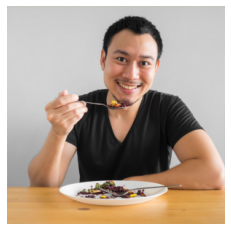

In [44]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

In [45]:
# import requests


a man with a blue shirt is standing in front of a table .
a young man is holding a plate of food .
a man is holding a plate of food .
a man is smiling while holding a plate of food .
a man with a bow tie standing in front of a table .
a man in a blue shirt is holding a plate .
a man is smiling while holding a plate of food .
a man with a big smile on his face .
a man with a tie and a glass of wine .
a man is holding a plate of food .


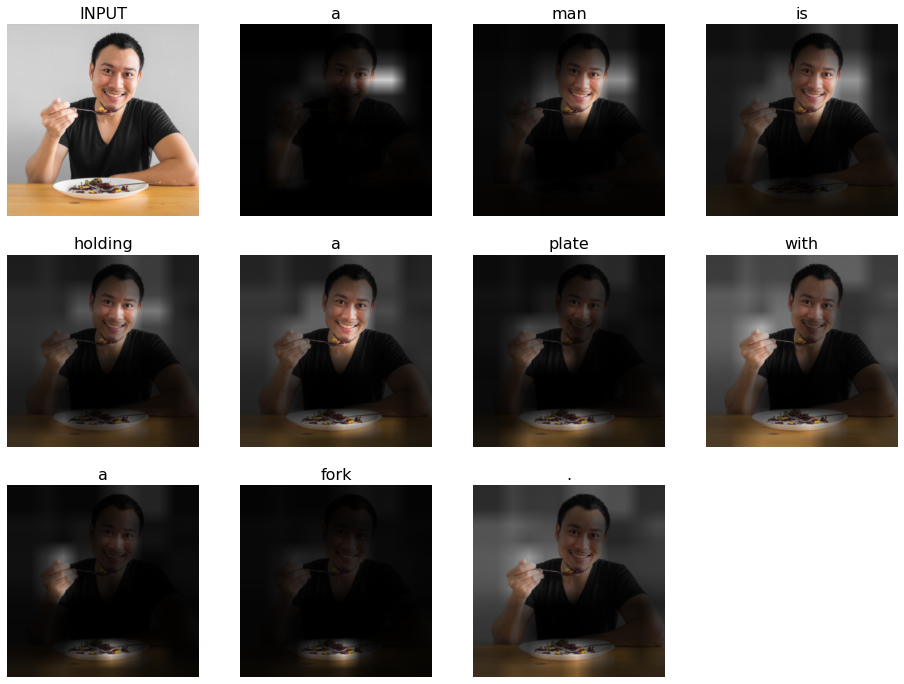

In [46]:
process_image(img)

a man riding a bike on a trail in the mountains .
a man riding a bicycle on a road with a dog .
a man riding a bicycle on a road with a mountain range .
a man riding a bicycle on a road with a dog .
a man riding a bicycle on a road near a river .
a man riding a bicycle on a road with a bicycle in the background .
a man riding a bike on a road next to a river .
a man riding a bicycle on a road with a dog on the back .
a man riding a bicycle on a river next to a river .
a man riding a bicycle on a road with a dog in the background .


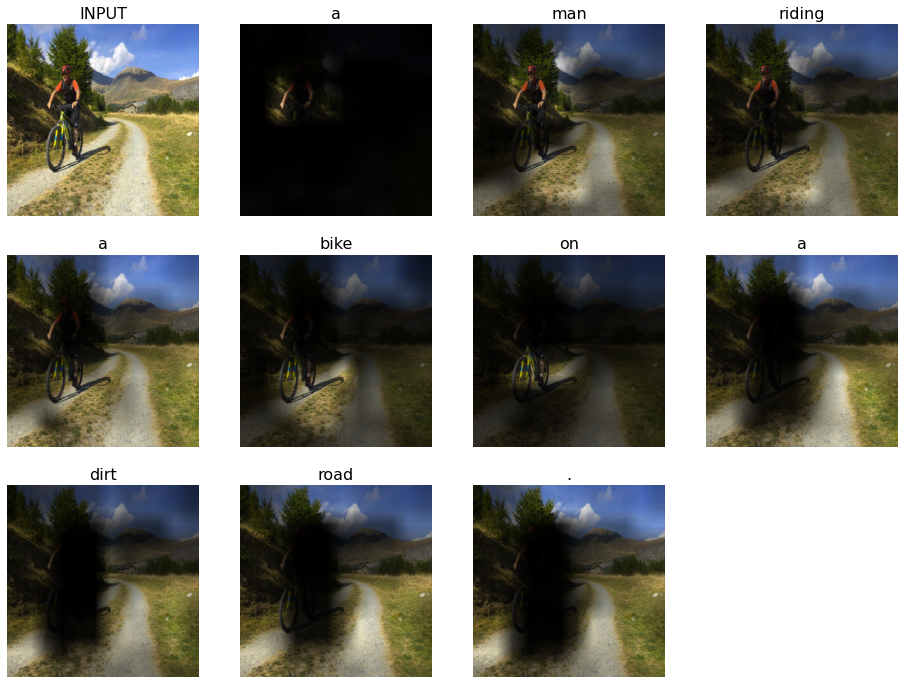

In [69]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a black and white cat laying on a couch .
a black and white cat laying on a couch
a black and white cat laying on a couch .
a black and white cat laying on a couch .
a small black cat laying on a couch .
a cat that is sitting on a couch .
a black and white cat laying on a couch .
a cat is sitting on a couch with a cat .
a black and white cat laying on a couch .
a black and white cat laying on a blanket .


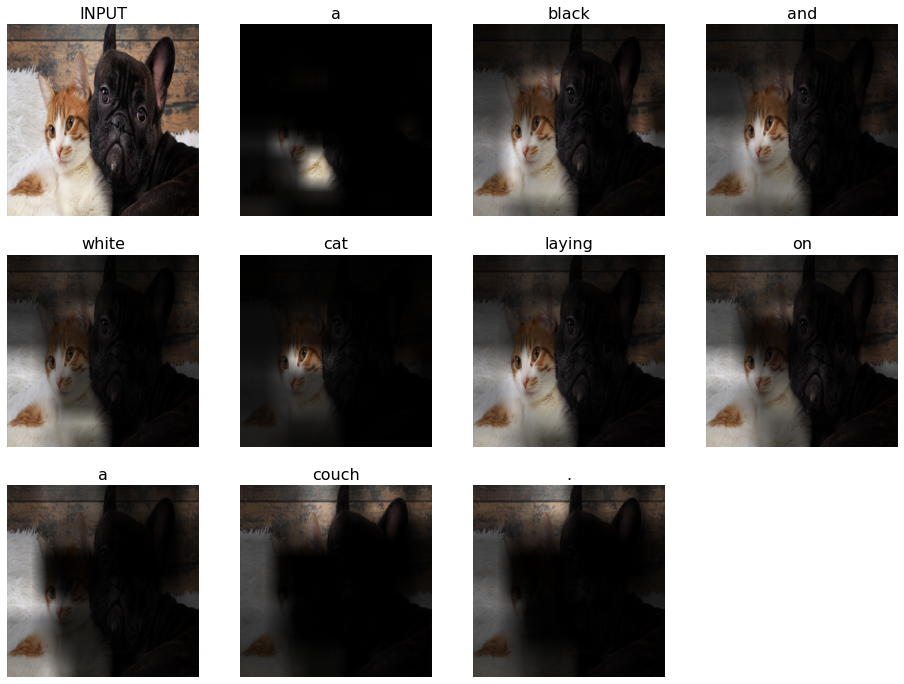

In [48]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man is doing a trick on a skateboard .
a man is doing a trick on his skateboard .
a man is doing a trick on his skateboard .
a man riding a skateboard on a ramp .
a man is doing a trick on a skateboard .
a man on a skateboard doing a trick on a skateboard .
a man is doing a trick on a skateboard .
a man is doing a trick on a skateboard .
a man is doing a trick on a skateboard .
a man in a skate park doing a trick on a skateboard .


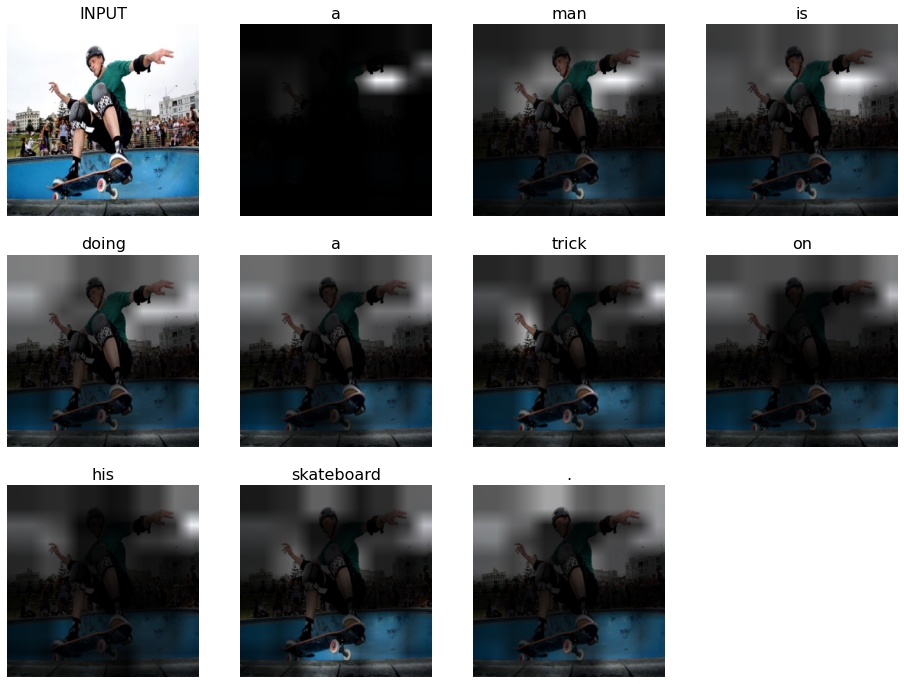

In [49]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

a group of people standing around a table with a cake .
a group of people sitting at a table with a cake .
a group of people sitting at a table with a laptop .
a group of people sitting around a table with a man on a table .
a group of people standing around a table with a cake .
a group of people sitting around a table with a cake .
a group of people sitting at a table with a cake .
a group of people sitting at a table with a laptop .
a group of people standing around a table with a cake .
a group of people standing around a table .


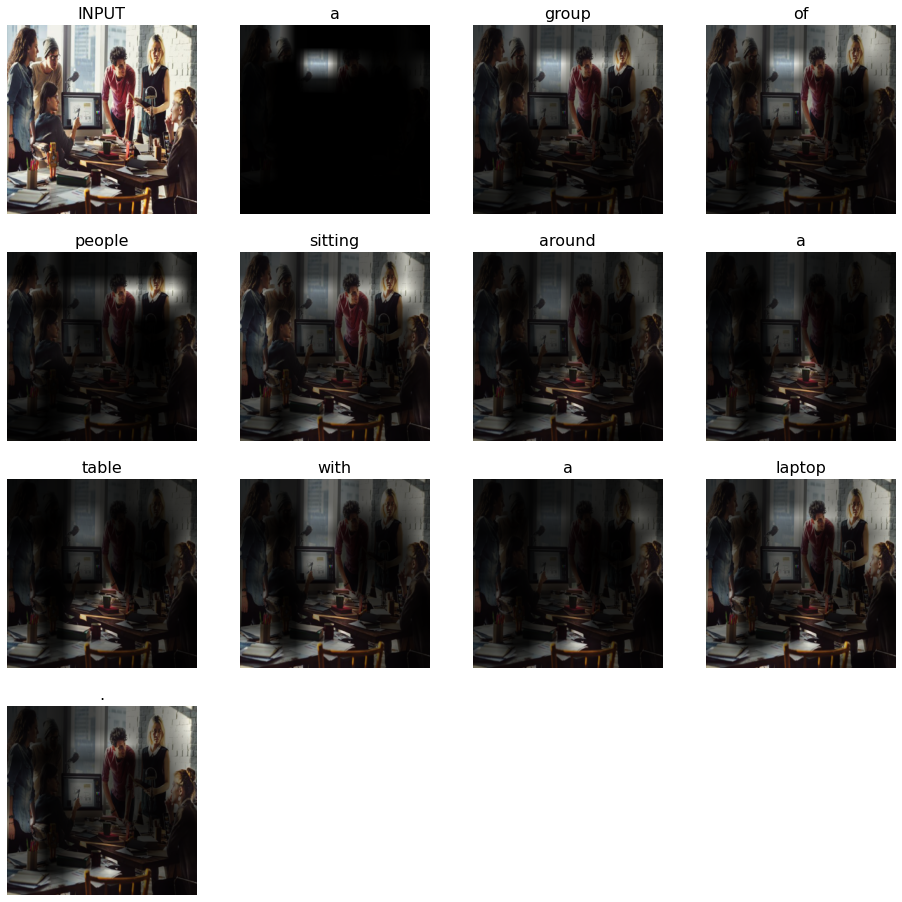

In [71]:
process_image(obtain_image(filename="./test/test/1.jpg"))

a woman sitting on a bench with a dog .
a woman with a black and white dog is standing in a field .
a woman is sitting on a bench with her dog .
a woman is sitting on a bench with her dog .
a woman is sitting on a bench next to a man .
a woman is sitting on a bench with a bird .
a woman is sitting on a bench with her dog .
a woman is sitting on a bench with a dog .
a little girl is sitting on a bench .
a woman is standing next to a baby elephant .


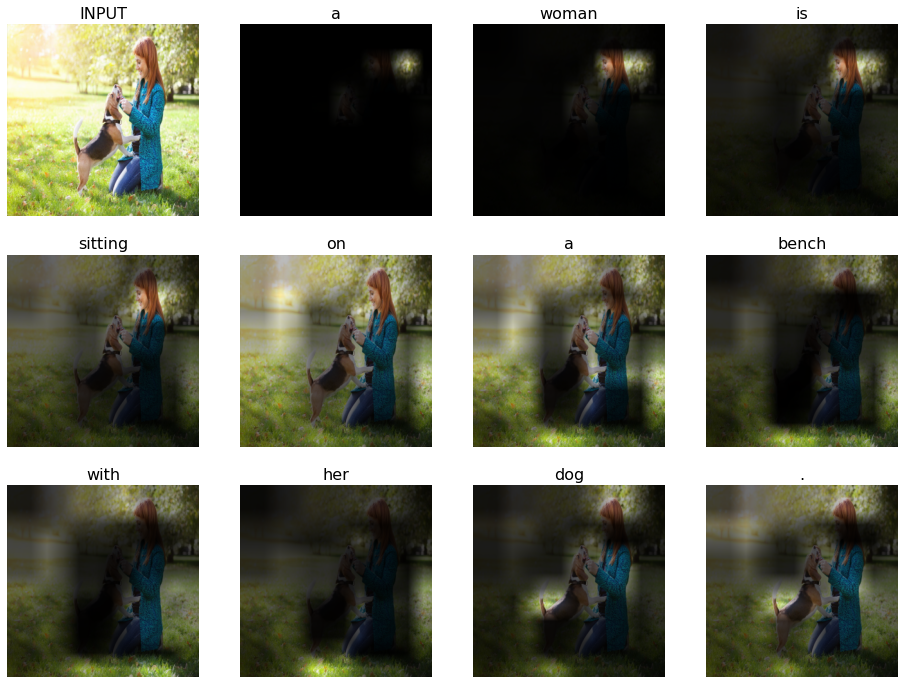

In [54]:
process_image(obtain_image(filename="./test/test/2.jpg"))

a group of people standing on a street corner .
a group of people standing next to a building .
a group of people standing next to a building .
a group of people standing outside of a building .
a group of people standing outside of a building .
a group of people standing next to a building .
a group of people standing next to a building .
a group of people standing in a parking lot .
a group of people standing next to a building .
a group of people standing around a building .


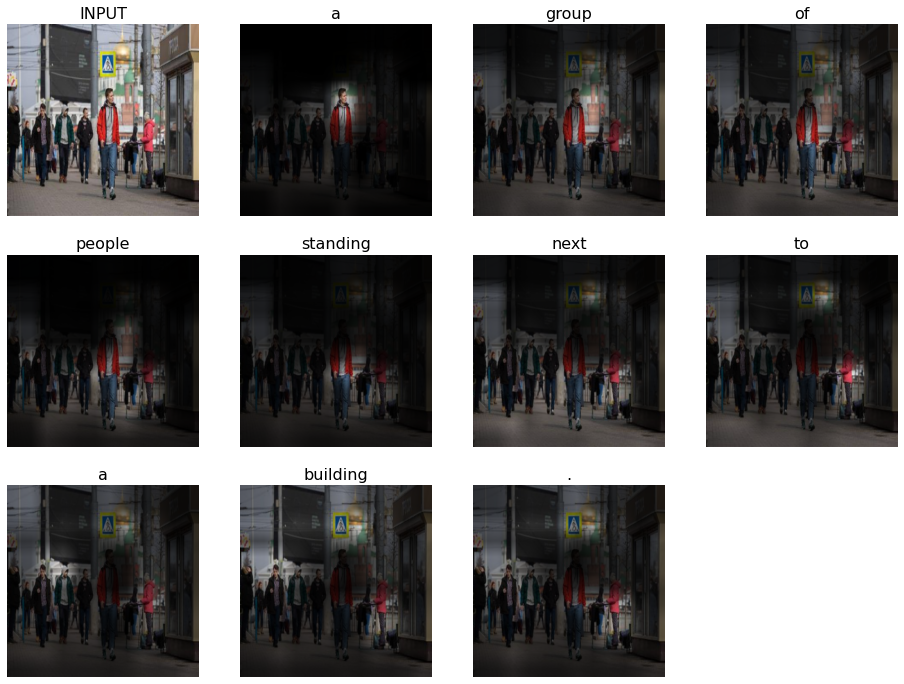

In [55]:
process_image(obtain_image(filename="./test/test/3.jpg"))

a group of people walking down a street with people walking in the rain .
a group of people walking down a street with people walking .
a group of people walking down a street with a horse drawn carriage .
a group of people walking down a street with umbrellas .
a group of people walking down a street with people walking down the street .
a group of people walking down a street with a horse and carriage .
a group of people walking down a street with people walking in the rain .
a group of people walking down a street with a large clock .
a group of people walking down a street with a large clock .
a large group of people walking down a street .


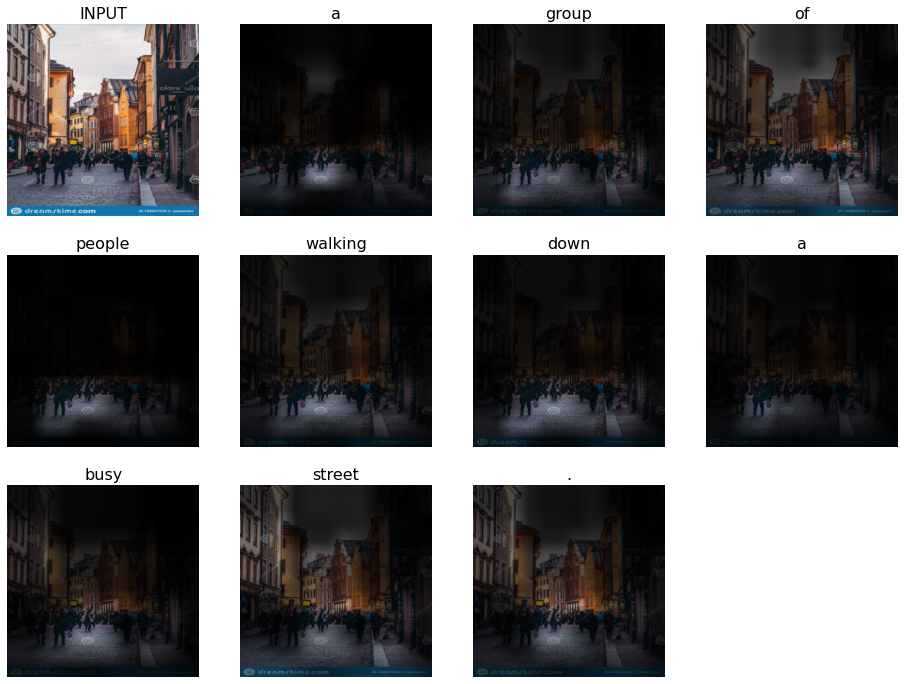

In [56]:
process_image(obtain_image(filename="./test/test/4.jpg"))

a dog laying on a bed with a white blanket .
a dog laying on a bed with a white blanket .
a dog laying on a bed with a white blanket .
a dog sitting on a bed with a white blanket .
a dog laying on a bed with a white blanket .
a dog laying on a bed with a white blanket .
a dog laying on a bed with a white blanket .
a dog laying on a bed with a white blanket .
a dog laying on a bed with a white blanket .
a dog laying on a bed with a white blanket .


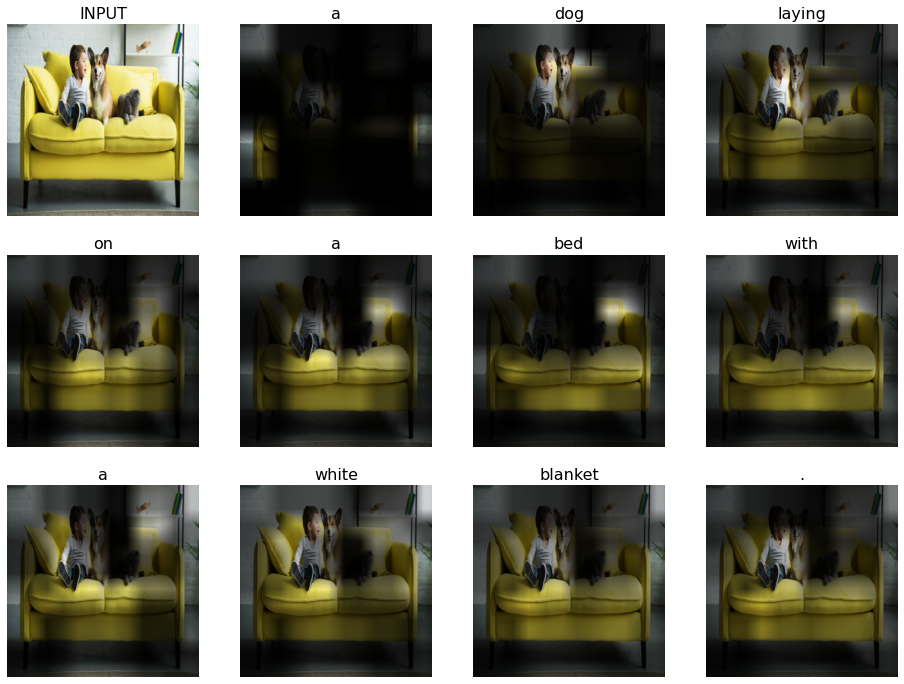

In [60]:
process_image(obtain_image(filename="./test/test/7.jpg"))

a man in a baseball uniform holding a racquet .
a man is playing tennis on a tennis court .
a man holding a tennis racquet on a tennis court .
a man in a baseball uniform holding a racquet .
a man holding a tennis racquet on a tennis court .
a man holding a tennis racquet on a tennis court .
a man in a tennis outfit holding a racquet .
a man in a tennis outfit holding a tennis racquet .
a man is holding a tennis racquet on a tennis court .
a man holding a tennis racquet on a tennis court .


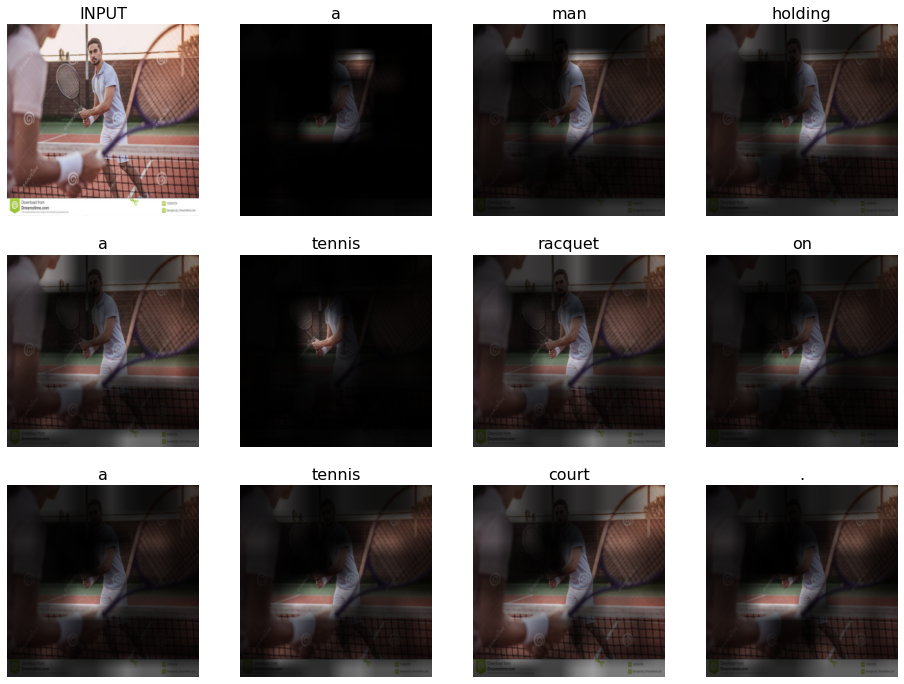

In [73]:
process_image(obtain_image(filename="./test/test/10.jpg"))

a river with a red and white and black and white photo of a person on a bicycle .
a row of boats parked in a canal .
a river with a large red umbrella on it .
a boat is docked in a canal on a river .
a boat is docked in a canal on a river .
a boat that is in the water near a river .
a river with a large red umbrella and a red umbrella .
a boat that is on a river in the city .
a large body of water with a red umbrella .
a boat that is sitting in the water .


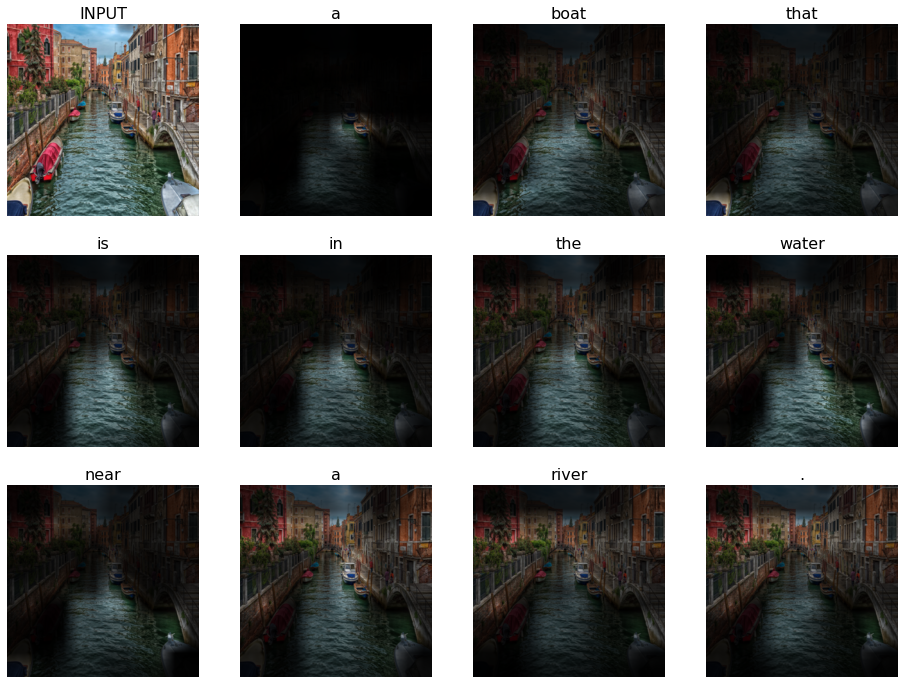

In [79]:
process_image(obtain_image(filename="./test/test/23.jpg"))

a large building with a clock on it .
a large building with a clock on it .
a large building with a clock on it .
a large bridge with a clock on it .
a large building with a clock on it .
a large building with a clock on it .
a large building with a clock on it .
a large bridge is in the middle of a river .
a large building with a clock on it .
a large building with a clock on it .


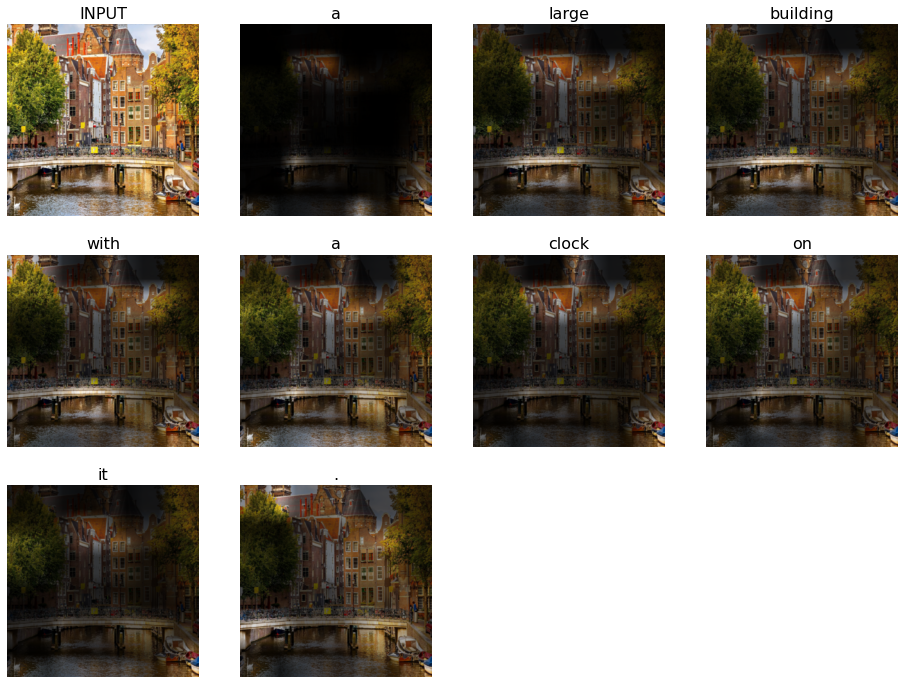

In [77]:
process_image(obtain_image(filename="./test/test/22.jpg"))

a baseball player is swinging at a ball .
a baseball player swinging a bat at a ball .
a baseball player is swinging at a ball .
a baseball player is hitting a ball with a bat .
a baseball player is getting ready to hit the ball .
a baseball player is swinging at a ball .
a baseball player is getting ready to swing his bat .
a baseball player holding a bat on a field .
a baseball player holding a bat on a field .
a baseball player is getting ready to hit a ball .


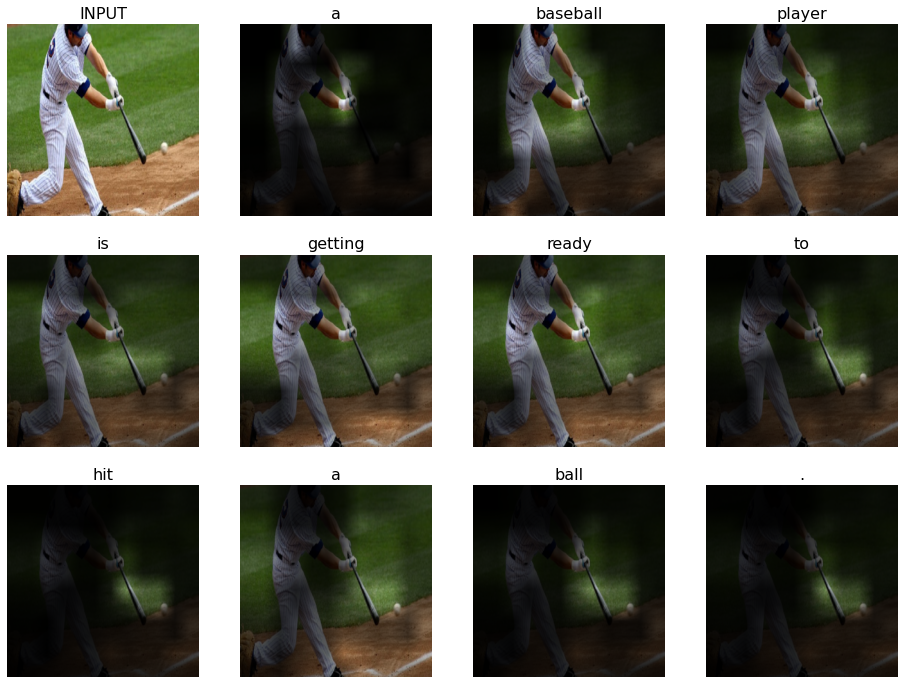

In [80]:
process_image(obtain_image(filename="./test/test/24.jpg"))

a baseball glove that is laying on a bed .
a baseball glove with a baseball glove on it .
a baseball glove that is standing in the grass .
a baseball glove that is standing in the grass .
a baseball glove on a field with a baseball bat .
a baseball glove with a baseball glove on it .
a baseball glove that is standing in the grass .
a baseball glove that is standing in the grass .
a baseball glove on a field with a baseball glove .
a baseball glove that is laying on the ground .


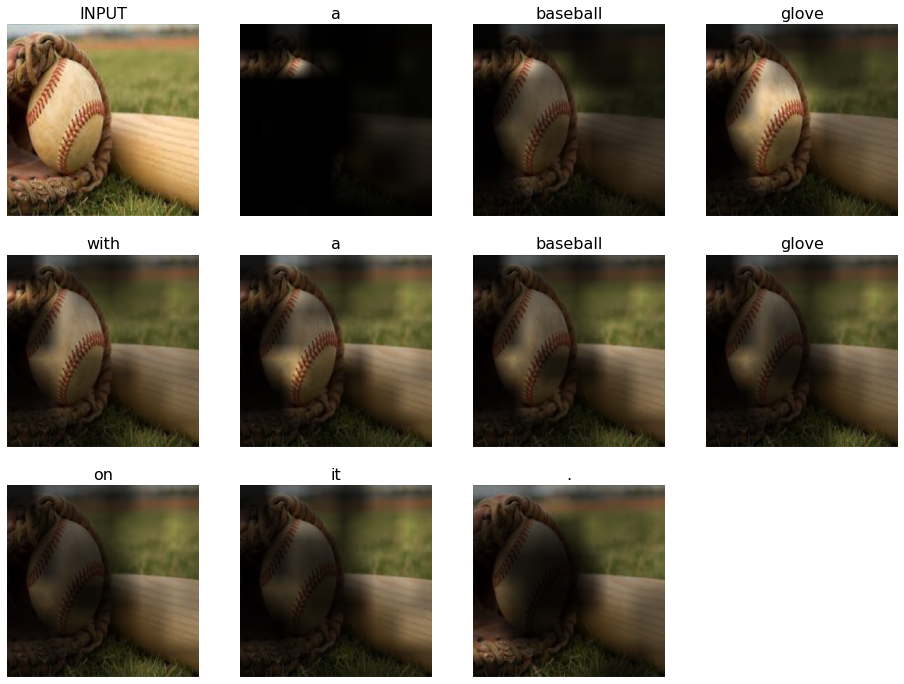

In [81]:
process_image(obtain_image(filename="./test/test/25.jpg"))

In [ ]:
#apply your network on image sample you found
#
#

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt). 
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563